In [ ]:
%load_ext autoreload
%autoreload 2

In [ ]:
import os
import sys
from glob import glob
import time

import pandas as pd
import numpy as np
import matplotlib.pyplot as plt

# to import logger, VR-wide constants and device paths
sys.path.append(os.path.join('.', ".."))
from baseVR.base_logger import CustomLogger as Logger
from baseVR.base_functionality import device_paths

import mea1k_modules.mea1k_visualizations as vis
from mea1k_utils import load_impedance_data as load_impedance_data
from mea1k_connectivity_scripts.analyze_extSine_connectivity import extract_connectivity, vis_connectivity, create_implant_dir, get_connectivity_data
from mea1k_connectivity_scripts.analyze_shortcut_stim import plot_amplitude_ridges, connected_islands

from mea1k_utils import cp_rec_dir_to_implant_dir

nas_dir = device_paths()[0]

In [ ]:
L = Logger()
L.init_logger(None, None, "WARNING")

### MEA23 test with 12x connector electrodes, to check if gold is still good for bonding of a valuable device, Monday 13.7

#### Approach:
* shorted with silver, had issues with liftoff a bitbut overall ok, many covered with silver, then connected thin wire
* did this on both sides, to check the whole device
* First time i used one of the connector PCBs
* in bewteen i did some very insightful current mode stimulation confirmation, it really works well, and only high imp gets confounded by DC current offset if 0-current DAC code drifts, can this be utalized somehow in the paper? COnfirming current mode stim?

#### Questions:
* How do new devices (now properly etched i hope) behave on MEA23? THe one that could be used for implantation?
* How does pressure affect bonding yield? Still uncertain. When do we start to see shorts?

#### idk
With low pressure, metal 1 (red) bonded first, as we have seen before. Strange, because it's further aways from cmos. Pillar hieght of this chip not intrely clear, this one was replated with 1.5 um if i remember correctly. perhaps there is really some degree of of van der waals forces that pull these pads down. Lower pads (metal2, pink) have 2um PI, not 1, so might not flex down as well. 
Had some strange shifts +2days in the morning, not sure if trusworthy data. The imp data on the same day suggested quite a bit of deterioaration, perhaps hinting at van der waals forces that are at play here. 
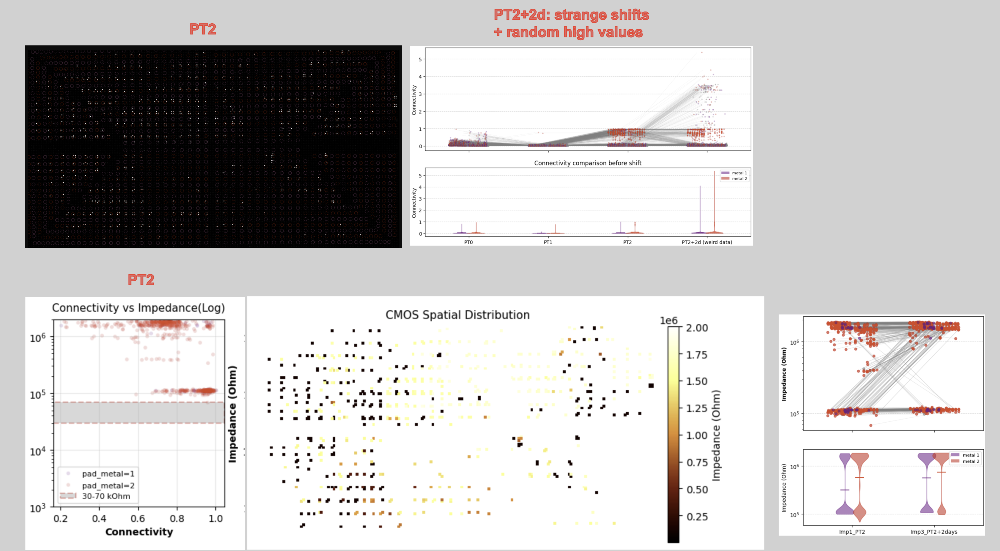

Tightening 3 (PT3) resulted in strong shift of top device. More than i had seen before, with FirstJamesSoldered  device/ bond. THis was also on MEA23. Perhaps pillars are low here, maybe 1um, not 1.5, and that promotes sheering, which i don't think i have seen before. In any case, this large shift was more than just sheering. proabbly pulled on device accidentally. Because then top part was shorted to GND ring, only measured the one below, but could actually redo it and measure top as well, realigned it as a new bonded implant. Would be good to compare with previous imp deteroration from PT2--> PT2+2d. 

I saw somehtintg interesting with PT3: increasing pressure brought metal2 engagement, shown in connectivity and then impedance as well. This i have not seen before liek this i think, or only very sporadically. I think for this to work, the etching needs to be good in the pits between the flex flaps. This was Also limited to specific areas of the chip, but that's geenerally the case. I think this is due to variablity in gold and echting quality i assume. But yeah, it follows my inutiion: this close-toCMOS pads, they need pressure, they don't flex well because they are often not etched as well and the flex needs to overcome 2um of PI. This is concerning for new design. It suggests that if pad doesn't flex well, impedance is high, right? This is the finding from previous bonding right? Well remember to most promising one on MEA23 a while ago? with the many shorts? That one was fully bonded, and it used one of Shubhams devices that had the etching issue. Promising. But that evel of pressure created shorts on ring... Should actually still image on confocal to do a final confirmation. Actually i am not 100% conviced. I always saw this pattern of early pressure level showing connection in high metal first, but pressure the other one come, although often only to 0.8 connectivity, suggesting it did get pressure, but enough to really touch the gold properly.

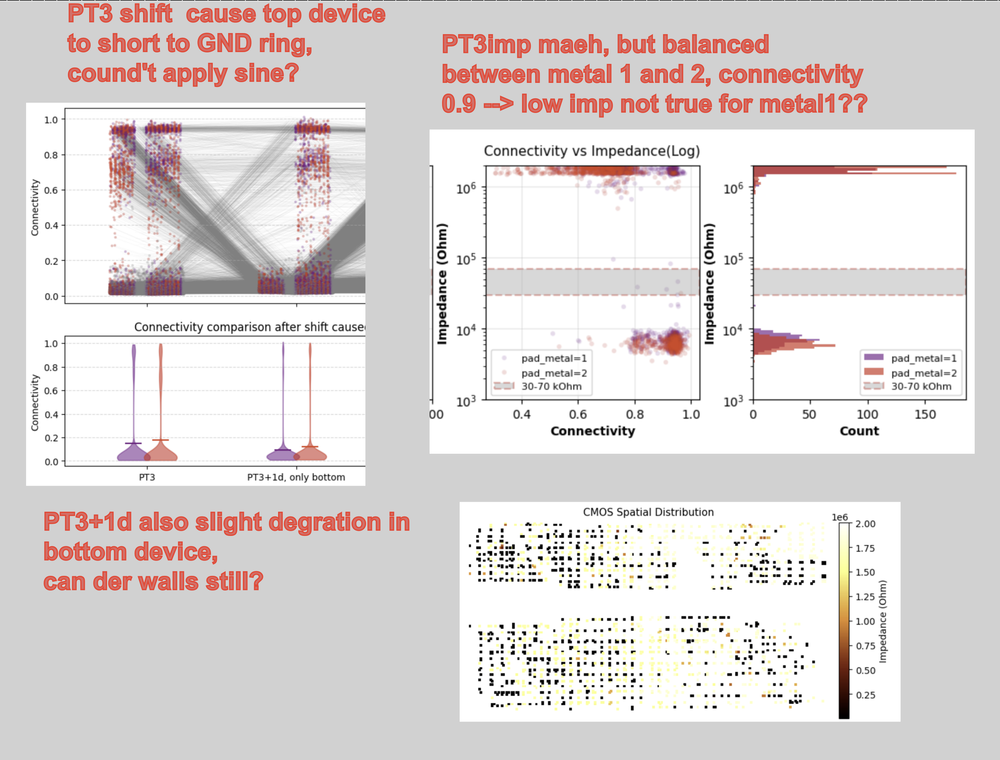

Interesting detail in the data: when the close-to-cmos pads bond (purple) the connectivity is high 0.9, but contratry to usual pattern, impedance is high for those pads. This is the last transition where small increases in connectivity like from .9 to .95 translate to 1-3 M improvements, it's the edge of the regime, very nice that we atch with. Because in PT4, this plob of 0.9 connectivity but high imp this is gone. It's like these "almost-bonded-pads" can be brought into low imp regime with pressure, but those that sit at 0.8, i am scptical they can be moved. It's like they stuck somewhere. Those with connectivity close 0 can still go directly to high connectivity >0.95 with low impedance as we see in PT4, their we don't have high connectivity- high impedance pads.
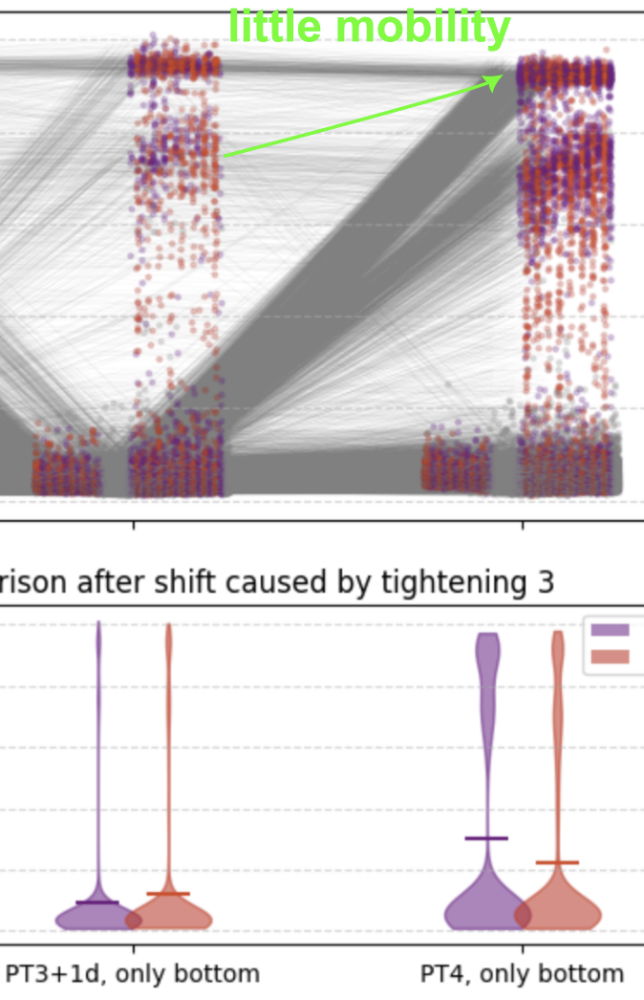


Lets talk about PT4, it results in large improvement, especailly for close-toCMOS pads (purple). THey really benefit from the pressure and can move to high connectivity & low impedance. Of course crucailly, we can ignore shorts here, which have been the major bottleneck / counter factor for high pressure... short on ringnode. as we suspect. In any case, PT4 looks good especally in bottom left corner, which would be nice to profile. One full area with good impedance for close-to-CMOS pads.

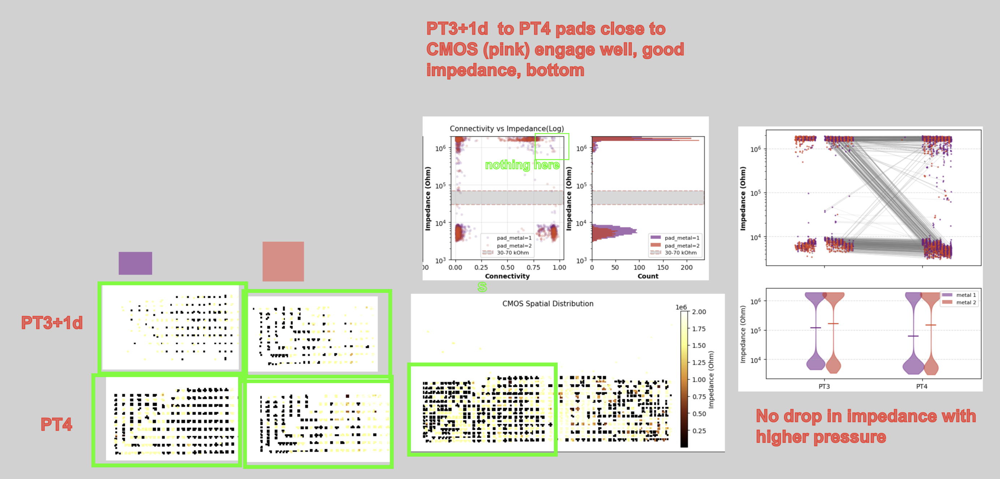

After +3 days, stimunits off, struggling with high impedance, but still can see low ones. Some changes from high to low and low to high in metal 2 mostly:
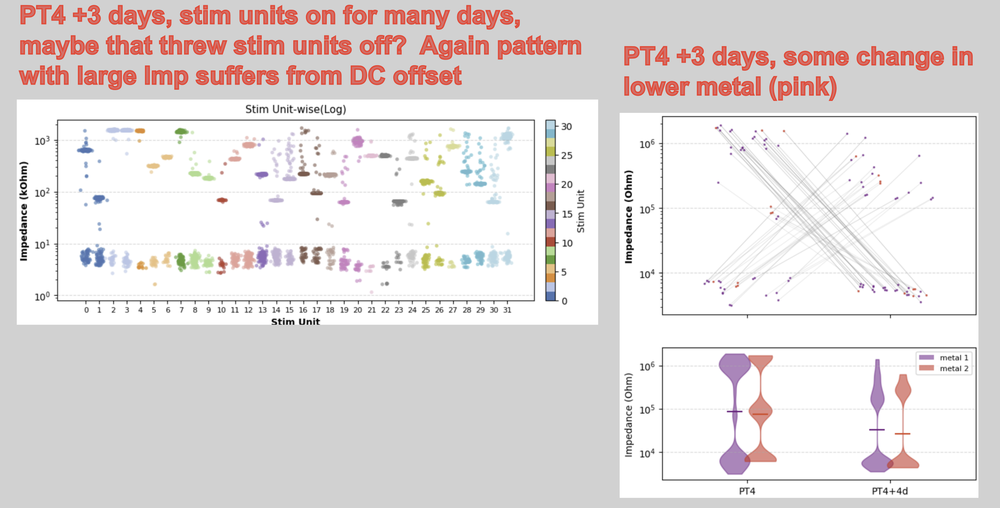

I also did another tightening, to PT5, imp stayed pretty stable, but sheering again! this time on a single device, only rright half shifted to the right. Shows how force behaves. But do good pads "move" together, showing that pad quality (ethcing) are more important than gold, which varies over chip. 
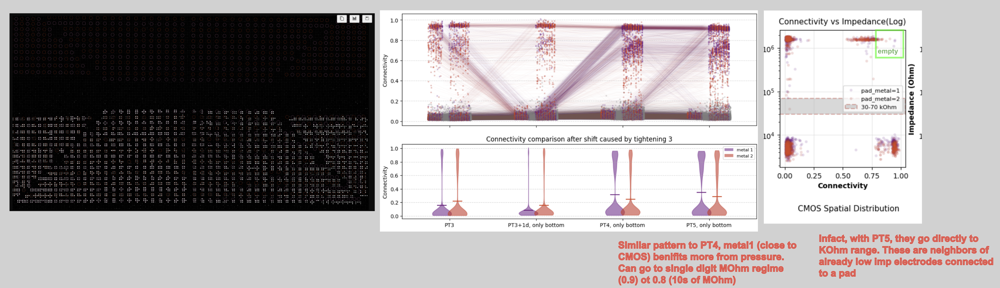

Below shows the moving, it actually didn't impedance! So a good pad can just "move over" to a new location? poiting to PI device being more important than gold? or good gold is neighbored by other good gold, only moved by 2 mea electrodes max
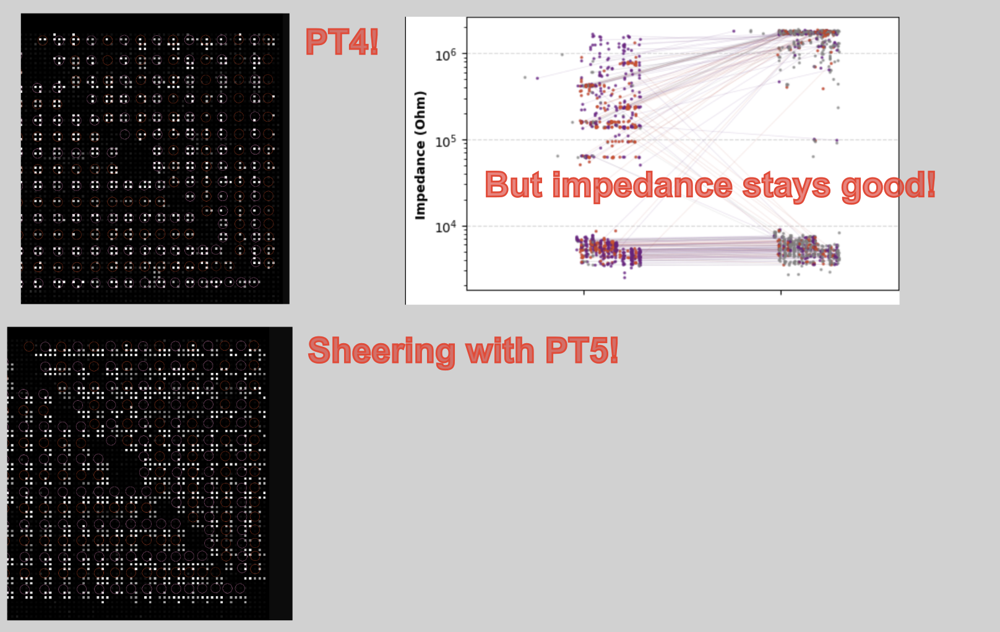

#### Next steps:

* Def measure connectivity again and chip if short to GND removed sine, like in ACF case --> Yes, can't apply sine to both, but impedance is possible, just <10K 
* check stability of impedance in PT4, measure torque and hieght ideally --> for stable measurements, should turn off for a while, to have them recover hopefully.
* Crucaully increase pressure to PT5 level, but carefully measure first  using Fuehlerlehen or calibrated/ labeled 3dprints. Can pads break? I don't think so if we don't put sheer forces, but shorts ofc are bad... Could check under mic afterwards
* image that 4+4 device that bonded well, want to be sure that we see shorts on ringnode,  actually try with scope + light angle
* and do height measurements for Chip23, i am curious about that bottom left corner, how did we get low imp there? And image also the polyimide device. Relate what caused good vs bad result. 



In [ ]:
nas_dir = device_paths()[0]
headstage_name = "MEA1K23"
subdir = f"devices/headstage_devices/{headstage_name}/recordings"

In [ ]:
headstage_name = "MEA1K23"
bonding_date = '260713'
# bonding_date = '260715' # after move...
HEADSTAGE_DEVICE_NAME = 'MEA1K23'
ELECTRODE_DEVICE_NAME = 'J1688pad2shank'
batch = 1
IMPLANT_DEVICE_NAME = f"{bonding_date}_{HEADSTAGE_DEVICE_NAME}_{ELECTRODE_DEVICE_NAME}B{batch}"
implant_name = IMPLANT_DEVICE_NAME

subdir = f"devices/headstage_devices/{headstage_name}/recordings"
impl_subdir = f"devices/implant_devices/{IMPLANT_DEVICE_NAME}/recordings"
nas_dir = device_paths()[0]

In [ ]:
fullfname = os.path.join(nas_dir, "devices", "implant_devices", implant_name, "bonding", 
                        f"bonding_mapping_{implant_name}.csv")
implant_mapping = pd.read_csv(fullfname, index_col=0)
display(implant_mapping)


In [ ]:
rec_names = [
    # '2026-07-13_15.39_JDesignFirstSoldered2_VRef15_PT0',
    # '2026-07-13_15.48_JDesignFirstSoldered2_VRef15_PT1',
    '2026-07-13_15.50_JDesignFirstSoldered2_VRef15_PT2',
    # '2026-07-15_07.50_JDesignFirstSoldered2_VRef15_PT2_+2d',
]

data = []
for rec_name in rec_names:
    full_path = os.path.join(nas_dir, impl_subdir, rec_name)
    # extract_connectivity(full_path, input_ampl_mV=10, n_samples=8000, debug=False, )
    # vis_connectivity(full_path, input_ampl_mV=10, cmap_scaler=1)
    
    conn = get_connectivity_data(full_path)
    conn = conn[conn['mea1k_el'] // 220 > 60]

    vis.draw_mea1k(mapping=conn, fast=True, draw_pads_if_available=True)
    print(rec_name)
    data.append(conn)
    plt.show()
    # create_implant_dir(full_path, nas_dir, HEADSTAGE_DEVICE_NAME, IMPLANT_DEVICE_NAME)

display(conn)

In [ ]:
# compare over runs
vis.compare_many_connectivities(data, ['PT0', 'PT1', 'PT2', 'PT2+2d (weird data)', ], color_metal=True, )
plt.title(f"Connectivity comparison before shift")

In [ ]:
rec_names = [
    "2026-07-13_18.57_JDesignFirstSoldered2_Imp1_PT2_LC_102KResistor",
    "2026-07-15_06.51_JDesignFirstSoldered2_Imp3_PT2_LC_102KResistor" # now in implant_name dir
]

# rec_dir = "2026-07-15_09.46_JDesignFirstSoldered2_Imp4_PT3_LC_102KResistor" # now in implant_name dir
# rec_dir = "2026-07-16_16.50_JDesignFirstSoldered2_Imp5_PT4_LC_102KResistor" # now in implant_name dir

data = []
for rec_name in rec_names:
    aggr_df, implant_mapping, full_recdir = load_impedance_data(rec_name, nas_dir, impl_subdir, implant_name)
    vis.plot_impedance_analysis(rec_name, aggr_df, log_scale=True, ylims=(1_000, 2_000_000), 
                                skip_bottom=True, color_by_metal=True )
    data.append(aggr_df)
    # vis.plot_ext_current_comparison(aggr_df, diff_max=2_000_000, title="")
    plt.show()

In [ ]:
vis.compare_impedance(data, ['Imp1_PT2', 'Imp3_PT2+2days'], color_metal=True, )

#### wierd data PT2+2d.. then shift of top device PT3, new implant mapping

In [ ]:
headstage_name = "MEA1K23"
# bonding_date = '260713'
bonding_date = '260715' # after move...
HEADSTAGE_DEVICE_NAME = 'MEA1K23'
ELECTRODE_DEVICE_NAME = 'J1688pad2shank'
batch = 1
IMPLANT_DEVICE_NAME = f"{bonding_date}_{HEADSTAGE_DEVICE_NAME}_{ELECTRODE_DEVICE_NAME}B{batch}"
implant_name = IMPLANT_DEVICE_NAME

subdir = f"devices/headstage_devices/{headstage_name}/recordings"
impl_subdir = f"devices/implant_devices/{IMPLANT_DEVICE_NAME}/recordings"
nas_dir = device_paths()[0]

In [ ]:
rec_names = [
    # '2026-07-15_07.55_JDesignFirstSoldered2_VRef15_PT3',
    # '2026-07-16_16.36_JDesignFirstSoldered2_VRef15_+1d_PT3',
    '2026-07-16_16.45_JDesignFirstSoldered2_VRef15_PT4', # tightened to check the bottom half of the device, does imp improve or worsen with pressure?  
    '2026-07-21_14.47_JDesignFirstSoldered2_VRef15_PT5',
]

data = []
for rec_name in rec_names:
    full_path = os.path.join(nas_dir, impl_subdir, rec_name)
    # extract_connectivity(full_path, input_ampl_mV=10, n_samples=8000, debug=False, )
    # vis_connectivity(full_path, input_ampl_mV=10, cmap_scaler=1)
    
    conn = get_connectivity_data(full_path)
    conn = conn[conn.mea1k_el //220 > 60]
    # conn = conn[conn.mea1k_el.isin(elctrodes)]
    vis.draw_mea1k(mapping=conn, fast=True )
    data.append(conn)
    plt.show()
    
    # create_implant_dir(full_path, nas_dir, HEADSTAGE_DEVICE_NAME, IMPLANT_DEVICE_NAME)


In [ ]:
# df = [data[i].set_index('mea1k_el')[['pad_metal', 'mea1k_connectivity']].rename(columns={'pad_metal': f'pad_metal_{i}', 'mea1k_connectivity': f'mea1k_connectivity_{i}'}).sort_index() for i in range(len(data))]
# df = pd.concat(df, axis=1).sort_index()
# df = df[df['mea1k_connectivity_1'].notna() & df['mea1k_connectivity_0'].notna()]

# df['imp_diff_0_1'] = df['mea1k_connectivity_1'] - df['mea1k_connectivity_0']

# elctrodes = df.index[(df['imp_diff_0_1'] > .3) & ((df['mea1k_connectivity_1'] < .3) | (df['mea1k_connectivity_0'] < .3))]
# print(len(elctrodes))


# data = [data[i][data[i].mea1k_el.isin(elctrodes)] for i in range(len(data))]
# # data[0]
# plt.hist(df['imp_diff_0_1'].dropna())
# data[0]
# data[0].mea1k_el.isin(data[1].mea1k_el), data[0].mea1k_el.isin(data[1].mea1k_el).sum()
# df



In [ ]:
# compare over runs
# vis.compare_many_connectivities(data, ['PT3', 'PT3+1d, only bottom',  'PT4, only bottom', 'PT5, only bottom'], color_metal=True, )
vis.compare_many_connectivities(data, ['PT2', 'PT3', 'PT4',  ], color_metal=True, )
# vis.compare_many_connectivities(data, ['PT4',  'PT5'], color_metal=True, )
plt.title(f"Connectivity comparison after shift caused by tightening 3")


In [ ]:
rec_names = [
    # "2026-07-15_09.46_JDesignFirstSoldered2_Imp4_PT3_LC_102KResistor", # now in implant_name dir
    # "2026-07-16_16.50_JDesignFirstSoldered2_Imp5_PT4_LC_102KResistor", # now in implant_name dir
    # "2026-07-19_12.45_JDesignFirstSoldered2_Imp6_Both_PT4_LC_102KResistor",
    # "2026-07-19_19.53_JDesignFirstSoldered2_Imp7_Both_PT4_LC_102KResistor",
    "2026-07-20_09.33_JDesignFirstSoldered2_Imp8_Bottom_PT4_LC_102KResistor",
    # "2026-07-21_15.55_JDesignFirstSoldered2_Imp9_Both_PT5_LC",
    "2026-07-22_09.26_JDesignFirstSoldered2_Imp11_Bottom_shiftAdjusted_PT5_LC",
]


data = []
for rec_name in rec_names:
    aggr_df, implant_mapping, full_recdir = load_impedance_data(rec_name, nas_dir, impl_subdir, implant_name)
    # aggr_df = aggr_df[aggr_df.pad_metal == 2]
    # aggr_df = aggr_df[aggr_df.electrode //220 > 60]
    aggr_df = aggr_df[aggr_df.electrode %220 > 150]
    # aggr_df = aggr_df[aggr_df.electrode.isin(elctrodes)]
    # aggr_df = aggr_df[aggr_df.connectivity > .9]
    vis.plot_impedance_analysis(rec_name, aggr_df, log_scale=True, #ylims=(100, 50_000), 
                                skip_bottom=True, color_by_metal=True, use_imp_connectivity=True )
    data.append(aggr_df)
    # vis.plot_ext_current_comparison(aggr_df, diff_max=2_000_000, title="")
    plt.show()

In [ ]:
# df = [data[i].set_index('electrode')[['pad_metal', 'impedance_Ohm']].rename(columns={'pad_metal': f'pad_metal_{i}', 'impedance_Ohm': f'impedance_Ohm_{i}'}).sort_index() for i in range(len(data))]
# df = pd.concat(df, axis=1).sort_index()
# df = df[df['impedance_Ohm_1'].notna() & df['impedance_Ohm_0'].notna()]
# df

# df['imp_diff_0_1'] = df['impedance_Ohm_1'] - df['impedance_Ohm_0']

# elctrodes = df.index[(df['imp_diff_0_1'].abs() > 40_000) & ((df['impedance_Ohm_1'] < 20_000) | (df['impedance_Ohm_0'] < 20_000))]
# print(len(elctrodes))
# data = [data[i][data[i].electrode.isin(elctrodes)] for i in range(len(data))]
# # data[0]
# plt.hist(df['imp_diff_0_1'].dropna())
# data[0]
# data[0].electrode.isin(data[1].electrode), data[0].electrode.isin(data[1].electrode).sum()
# df



In [ ]:
vis.compare_impedance(data, [ 'PT4', 'PT5'], color_metal=True, log_scale=True)

In [ ]:
# rec_dir = "2026-07-13_16.34_JDesignFirstSoldered2_Imp1_PT2_LC"
# rec_dir = "2026-07-13_16.48_JDesignFirstSoldered2_Imp1_PT2_LC"
# rec_dir = "2026-07-13_18.57_JDesignFirstSoldered2_Imp1_PT2_LC_102KResistor"
# rec_dir = "2026-07-13_18.57_JDesignFirstSoldered2_Imp1_PT2_LC_102KResistor" # now in implant_name dir
# rec_dir = "2026-07-15_06.51_JDesignFirstSoldered2_Imp3_PT2_LC_102KResistor" # now in implant_name dir
# rec_dir = "2026-07-15_09.46_JDesignFirstSoldered2_Imp4_PT3_LC_102KResistor" # now in implant_name dir
rec_dir = "2026-07-21_15.55_JDesignFirstSoldered2_Imp9_Both_PT5_LC" # now in implant_name dir

log_scale = True


aggr_df, implant_mapping, full_recdir = load_impedance_data(rec_dir, nas_dir, impl_subdir, implant_name)
# aggr_df = aggr_df[aggr_df['connectivity'] > .9]
# aggr_df = aggr_df[aggr_df['stim_unit'].isin([0, 5, 11, 16,29])]
vis.plot_impedance_analysis(rec_dir, aggr_df, log_scale=log_scale, #ylims=(1_000, 2_000_000), 
                            skip_bottom=False, color_by_metal=False, use_imp_connectivity=False, )
# vis.plot_ext_current_comparison(aggr_df, diff_max=2_000_000, title="")
plt.show()

# plt.scatter(aggr_df.connectivity, aggr_df.mea1k_connectivity, s=1)
plt.hist(implant_mapping.mea1k_connectivity, bins=50)
plt.yscale('log')
aggr_df

In [ ]:

rec_dir = '2026-07-13_16.52.59_JamesSoldered2_TileShortsFull_PT2'
full_recdir = os.path.join(nas_dir, subdir, rec_dir)
connected_islands(full_recdir, output_dir=os.path.join(full_recdir, "processed"), 
                  conn_thr=.5, output_fname=f"connected_islands.png",
                  draw_mea_args={"mapping":conn, "el_color":"#595959", 'cmap_scaler':2})

plot_amplitude_ridges(full_recdir, shorted_thresh=.4, n_groups=1, min_stim_uV=1000, rebuilt_graph=True)


In [ ]:
rec_dir = "2026-07-13_21.10.04_SingleShorts_JamesSoldered2_PT2"
rec_dir = "2026-07-13_21.22.01_SingleShorts_JamesSoldered2_PT2"
full_recdir = os.path.join(nas_dir, subdir, rec_dir)
connected_islands(full_recdir, output_dir=os.path.join(full_recdir, "processed"), 
                  conn_thr=.9, output_fname=f"connected_islands.png",
                  draw_mea_args={"mapping":conn, "el_color":"#595959", 'cmap_scaler':2})

plot_amplitude_ridges(full_recdir, shorted_thresh=.9, n_groups=1, min_stim_uV=1000, rebuilt_graph=True)


In [ ]:
rec_dir = "2026-07-14_19.59_JDesignFirstSoldered2_Imp1_PT2_LC_102KResistor"
log_scale = True

aggr_df_1dlater, implant_mapping, full_recdir = load_impedance_data(rec_dir, nas_dir, impl_subdir, implant_name)
# aggr_df = aggr_df[aggr_df['connectivity'] > .9]
# aggr_df = aggr_df[aggr_df['stim_unit'].isin([0, 5, 11, 16,29])]
vis.plot_impedance_analysis("One day later", aggr_df_1dlater, log_scale=log_scale, ylims=(1_000, 2_000_000), 
                            skip_bottom=False, color_by_metal=True, use_imp_connectivity=True, )
vis.plot_ext_current_comparison(aggr_df_1dlater, diff_max=2_000_000, title="")
plt.show()

# plt.scatter(aggr_df.connectivity, aggr_df.mea1k_connectivity, s=1)
# plt.hist(implant_mapping.mea1k_connectivity, bins=50)
# plt.yscale('log')

In [ ]:
# compare aggr_df and aggr_df_1dlater
# find common electrodes
common_electrodes = set(aggr_df.electrode).intersection(set(aggr_df_1dlater.electrode))
aggr_df_common = aggr_df[aggr_df.electrode.isin(common_electrodes)].sort_values('electrode').reset_index(drop=True)
aggr_df_1dlater_common = aggr_df_1dlater[aggr_df_1dlater.electrode.isin(common_electrodes)].sort_values('electrode').reset_index(drop=True)

# measure before, check if DAC shifting degraded connection? 
DAC_shifted_electrodes = np.array([ 4285,  4639,  4916,  4921,  4930,  5140,  5150,  5312,  6173,
        6456,  6675,  6857,  7361,  8001,  8216,  8896,  8912,  9747,
       11027, 11246, 11247, 11967, 16672, 18204, 18212, 18213, 18309,
       18433, 19618, 19622, 19841, 19981, 20427, 21144, 22907, 22910,
       24465])
# color those in scatter plot
colors = ['blue' if el in DAC_shifted_electrodes else 'gray' for el in aggr_df_common.electrode]
# draw scatter plot of impedance values for common electrodes
plt.scatter(aggr_df_common.impedance_Ohm, aggr_df_1dlater_common.impedance_Ohm, s=50, alpha=0.5, color=colors)
# plt.plot([1_000, 2_000_000], [1_000, 2_000_000], 'r--', label='y=x')
# draw top/left triangle to indicate degradation
plt.fill_between([80_000, 2_000_000], [80_000, 2_000_000], [2_000_000, 2_000_000], color='red', alpha=0.05, label='Degradation')
plt.fill_between([80_000, 2_000_000], [80_000, 80_000], [80_000, 2_000_000], color='green', alpha=0.05, label='Improvement')

plt.xscale('log')
plt.yscale('log')
plt.xlabel('Impedance (Ohm) - Day 0')
plt.ylabel('Impedance (Ohm) - Day 1')
plt.title('Impedance Comparison - Day 0 vs Day 1 - clear Degradation ')

In [ ]:
log_scale = True

# rec_dir = "2026-07-03_21.04_JFirstSoldered_Imp2_PT3_LC"
# rec_dir = "2026-07-09_12.26_JFirstSoldered_Imp1_PT4_LC"
rec_dir = "2026-07-09_12.51_JFirstSoldered_Imp2_PT4_SC"

aggr_df, implant_mapping, full_recdir = load_impedance_data(rec_dir, nas_dir, subdir, implant_name)
# aggr_df = aggr_df[aggr_df['shank_id']<5]  # only real shanks
vis.plot_impedance_analysis("", 
                            aggr_df, log_scale=log_scale, ylims=(1_000, 2_000_000), skip_bottom=False, color_by_metal=True)
vis.plot_ext_current_comparison(aggr_df, diff_max=2_000_000, title="Small current mode")
 

In [ ]:
# Load connectivity table
connectivity = pd.read_csv(
    os.path.join(
        nas_dir,
        subdir,
        '2026-07-03_09.38_JDesignFirstSoldered_ext10mV_PT3',
        'processed',
        'extr_connectivity.csv'
    )
)

# Keep a MEA-style view and compute spatial coordinates exactly like draw_mea1k
conn_map = connectivity.rename(
    columns={'el': 'mea1k_el', 'connectivity': 'mea1k_connectivity'}
).copy()
conn_map['x'] = (conn_map['mea1k_el'] % 220) * 17.5 + 17.5 / 4
conn_map['y'] = (conn_map['mea1k_el'] // 220) * 17.5 + 17.5 / 4

# Bounding boxes (same limits as plotted guide lines)
red_x_min, red_x_max = 15 * 17.5, 18 * 17.5
red_y_min, red_y_max = 48 * 17.5, 51 * 17.5

blue_x_min, blue_x_max = 12 * 17.5, 15 * 17.5
blue_y_min, blue_y_max = 41 * 17.5, 44 * 17.5

# Slice subsets by x/y
red_mask = (
    (conn_map['x'] >= red_x_min) & (conn_map['x'] <= red_x_max) &
    (conn_map['y'] >= red_y_min) & (conn_map['y'] <= red_y_max)
)
blue_mask = (
    (conn_map['x'] >= blue_x_min) & (conn_map['x'] <= blue_x_max) &
    (conn_map['y'] >= blue_y_min) & (conn_map['y'] <= blue_y_max)
)

red_subset = conn_map[red_mask].copy()
blue_subset = conn_map[blue_mask].copy()

# Set selected electrodes to connectivity=10 for confirmation plot
conn_map_marked = conn_map.copy()
selected_mask = red_mask | blue_mask
# conn_map_marked.loc[selected_mask, 'mea1k_connectivity'] = 10
conn_map_marked.loc[selected_mask, 'mea1k_connectivity'] = conn_map_marked.loc[selected_mask, 'mea1k_connectivity']

print(f"Red subset rows: {len(red_subset)}")
print(f"Blue subset rows: {len(blue_subset)}")
print(f"Total marked rows: {selected_mask.sum()}")

# Draw modified map
vis.draw_mea1k(mapping=conn_map_marked, fast=True, cmap_scaler=2)

# Draw red box guides
# plt.axvline(x=red_x_min, color='red', linestyle='--', linewidth=1)
# plt.axvline(x=red_x_max, color='red', linestyle='--', linewidth=1)
# plt.axhline(y=red_y_min, color='red', linestyle='--', linewidth=1)
# plt.axhline(y=red_y_max, color='red', linestyle='--', linewidth=1)

# # Draw blue box guides
# plt.axvline(x=blue_x_min, color='blue', linestyle='--', linewidth=1)
# plt.axvline(x=blue_x_max, color='blue', linestyle='--', linewidth=1)
# plt.axhline(y=blue_y_min, color='blue', linestyle='--', linewidth=1)
# plt.axhline(y=blue_y_max, color='blue', linestyle='--', linewidth=1)

# Optional quick peek
display(red_subset
)
display(blue_subset
)

In [ ]:
rec_name = '2026-07-04_11.57.09_JFirstTrySoldered_CurrentCentered_260703_MEA1K23_S844pad8shankB1'
rec_name2 = '2026-07-04_16.43.21_JFirstTrySoldered_CurrentCentered+10DAC_260703_MEA1K23_S844pad8shankB1'
rec_name3 = '2026-07-04_17.54.57_JFirstTrySoldered_CurrentCentered-10DAC_260703_MEA1K23_S844pad8shankB1'


short_stim_res_fname = f'/mnt/SpatialSequenceLearning/devices/headstage_devices/MEA1K23/recordings/{rec_name}/processed/extracted_sine_voltages.csv'
short_stim_res = pd.read_csv(short_stim_res_fname)

short_stim_res_fname2 = f'/mnt/SpatialSequenceLearning/devices/headstage_devices/MEA1K23/recordings/{rec_name2}/processed/extracted_sine_voltages.csv'
short_stim_res2 = pd.read_csv(short_stim_res_fname2)
short_stim_res_fname3 = f'/mnt/SpatialSequenceLearning/devices/headstage_devices/MEA1K23/recordings/{rec_name3}/processed/extracted_sine_voltages.csv'
short_stim_res3 = pd.read_csv(short_stim_res_fname3)
short_stim_res


In [ ]:
stimulated = short_stim_res[short_stim_res['stim'] == True]



In [ ]:
# plt.hist(short_stim_res[short_stim_res['stim'] == True].sine_voltage_uV, bins=80)

plt.figure(figsize=(8*3, 4*3))
sc = plt.scatter(stimulated.x, 
            stimulated.y, marker='s', s=40,cmap='magma', vmin=0, vmax=300_000,
                c=stimulated.sine_voltage_uV/0.5)
plt.ylim(2100+100, -100)
plt.xlim(-100, 3850+100)
# add colorbar
cbar = plt.colorbar(sc)
# fix aspect ratio
plt.gca().set_aspect('equal', adjustable='box')

In [ ]:
short_stim_res = short_stim_res[short_stim_res['stim'] == True].set_index("el", drop=True).sort_index()
short_stim_res2 = short_stim_res2[short_stim_res2['stim'] == True].set_index("el", drop=True).sort_index()
short_stim_res3 = short_stim_res3[short_stim_res3['stim'] == True].set_index("el", drop=True).sort_index()
short_stim_res3

In [ ]:
# dac shift results
plt.figure(figsize=(8*3, 4*3))
plt.xlim(-0.5, 4.5)
plt.xticks([1, 2, 3], ['0 DAC', '-10 DAC', '+10 DAC'])
for el in short_stim_res.index:
    v1 = short_stim_res.loc[el, 'sine_voltage_uV']
    v2 = short_stim_res2.loc[el, 'sine_voltage_uV']
    v3 = short_stim_res3.loc[el, 'sine_voltage_uV']
    plt.plot([1, 2, 3], [v1, v2, v3], marker='o', color='blue', alpha=0.2)
    # print(f"Electrode {el}: {v1:.2f} uV, {v2:.2f} uV, {v3:.2f} uV")
    # break
plt.show()

In [ ]:
nas_dir = device_paths()[0]
# implant_name = "260703_MEA1K23_S844pad8shankB1"
headstage_name = "MEA1K22"
subdir = f"devices/headstage_devices/{headstage_name}/recordings"

# History



## MEA23

* Interesting stuff. I think here goldplating randomly stopped early... so pillars were low. i tried a single no press bond early/mid april: 2026-04-09_14.44.38_SC_noPressBond_/ Then alexei replated some amount. i think 1.5 um. Perhaps this one has quite high pillars. Needs this profilemeter ffs.... Because then I did a testbond I think shortly after the presentation I gave, where I picked up 4 shanks with wafer, and 4 with silver (right, 5,6,7,8). Did a pressure gradient, and saw how imp improved radically from 1.9 to 1.7. This one is complicated though. Because the silver shanks influced the voltage map readouts, they dropped when measured together. Alfter many measurementes, i figured shorts to GND ring of a few electrodes could short everything to GND, current didn't flow through external sense circuit (solution) when the 4 silver were in there. Here, i also reanalyzed shorts properly for this and foound reasonable pattern where true shorts (pads that are connected by design) have quite a bit higher amplitude than others. But still they shared quite a bit of signal, like 20% - 30%  still not that little tbh... When using manual stimulaiton, saw them everywhere....
![alt text](image-21.png)
![alt text](image-20.png)
![alt text](image-19.png)
![alt text](image-22.png)
On Tuesday, 30.June, went back to this device, in parallel to disassmbley of MEA1K24 (half gold chip) redid imp measurements, and did external current stimulation. 

After this, shorts remained on the surface, because of such extreme pressure. 

After long long time, bonded a JamesFirstSOldered device. NOt very elegant, right side disconncetd for some reason. impedance bad already in the beginning, then did short cut stim bewteen pads and saw imp was lower, but complicate with 2 DACs etc. Back then though that the wire get "squeezed" on passivation, but that doesn't make sense really, because shorted pads also go over that twice. Rather pointed at bad silver soldering, also kinda makes sense, was dirty, and gold sorface way to large. Also saw nice shorts to GND ring , informative, saw tiny impedance for those.
Then I did a tightening, and saw that device can sheer over surface, probably flaps are broken at this point. Also, metal 2 very bad on this one
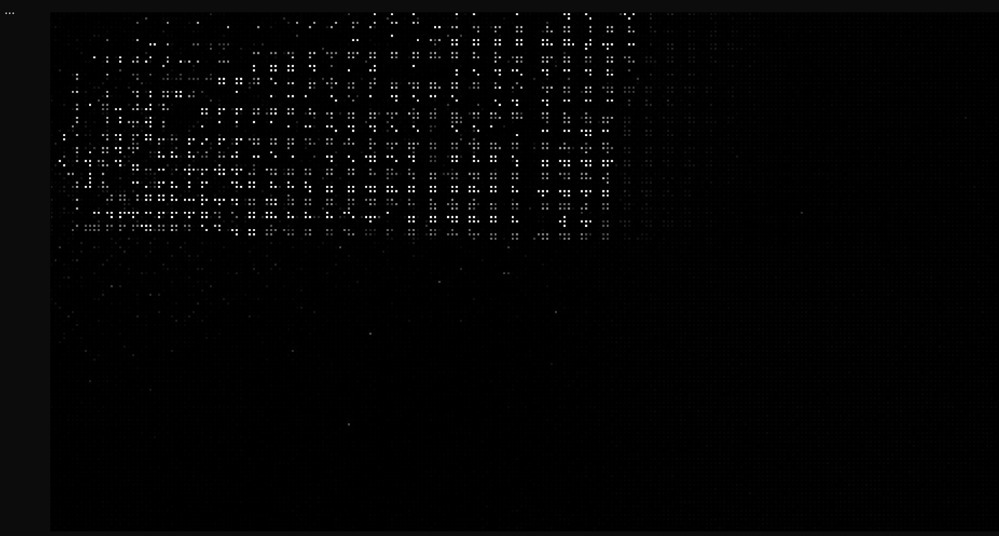
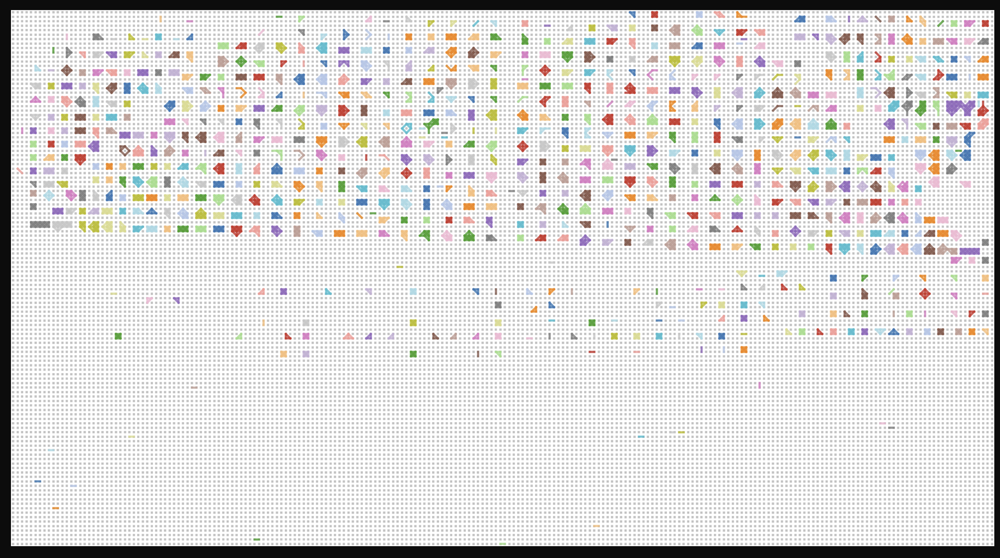
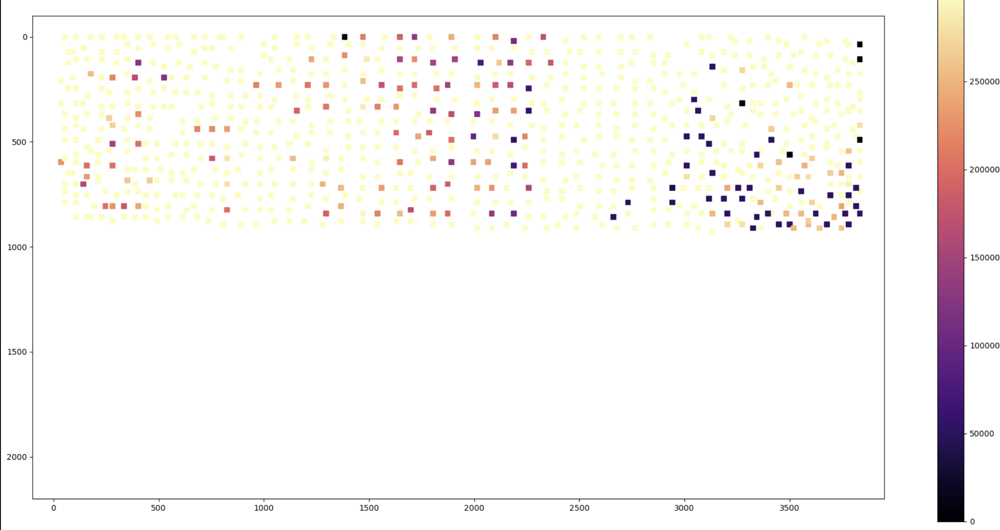
